In [1]:
import os, sys
import numpy as np
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib
import matplotlib.pyplot as plt
import yaml

from getdist import loadMCSamples, plots, mcsamples, MCSamples
from tensiometer import gaussian_tension as gt
from tensiometer_dev.tensiometer import *

chain_dir = os.path.join(os.getcwd(), 'chains')

cosmo_prior = loadMCSamples(file_root=chain_dir+'/lcdm_eftboss/2023-10-12_10000_cosmo_prior_', 
                          settings={'ignore_rows':0., 'smooth_scale_1D':-1, 'smooth_scale_2D':-1})
cosmo_prior.name_tag = 'BOSS Prior'
# Check completeness
print(f'List of \"cosmological\" parameters: {cosmo_prior.getParamNames().getRunningNames()}')
print(f'     List of \"derived\" parameters: {cosmo_prior.getParamNames().getDerivedNames()}')

2023-11-16 13:39:23.208803: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-11-16 13:39:23.712307: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-16 13:39:23.712343: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-16 13:39:23.714824: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-11-16 13:39:23.986933: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-11-16 13:39:23.990474: I tensorflow/core/platform/cpu_feature_guard.cc:182] This Tens

List of "cosmological" parameters: ['omega_b', 'omega_cdm', 'h', 'ln10^{10}A_s', 'n_s']
     List of "derived" parameters: ['Omega_m', 'A_s', 'sigma8']


In [2]:
# Add S8 as a derived parameter using GetDist
p = cosmo_prior.getParams()
cosmo_prior.addDerived(p.sigma8*np.sqrt(p.Omega_m/0.3), name='S8', label='S_8')

# Repeat the process for the posterior
posterior = loadMCSamples(file_root=chain_dir+'/lcdm_eftboss/2023-10-12_10000_',
                          settings={'ignore_rows':0.3, 'smooth_scale_1D':-1, 'smooth_scale_2D':-1})
posterior.name_tag = 'BOSS'

p = posterior.getParams()
posterior.addDerived(p.sigma8*np.sqrt(p.Omega_m/0.3), name='S8', label='S_8')

from python_scripts.prior import * 
from python_scripts.utils import *
# Get parameters' fixed prior boundaries
prior = priorChain(filepath='chains/lcdm_eftboss/2023-10-12_10000_.paramnames', input_name='eftboss')

In [3]:
# Nuisance Parameters (varying)
nuisance_prior = prior.get_nuisance_prior(config_name='boss_pk_wc', ignore_rows=0.)
nuisance_prior.name_tag = 'Nuisance Prior'
nuisance_names = prior.nuisance_names

### Complete Set
We now reproduce the previous work session including also the EFT nuisance parameters. The complete set of parameters becomes: $h$, $\omega_{cdm}$, $\ln{10^{10}A_s}$, $n_s$, $\Omega_m$, $\sigma_8$, $b1_{hN}$, $c2_{hN}$, $b1_{hS }$, $c2_{hS }$, $b1_{lN }$, $c2_{lN }$, $b1_{lS }$, $c2_{lS }$. 

In [4]:
# Loading both cosmological and EFT parameters
prior_chain = cosmo_prior.copy()
posterior_chain = posterior.copy()
p = nuisance_prior.getParams()
for name, label in zip(prior.nuisance_names, prior.nuisance_labels):
    method = getattr(p, name)
    prior_chain.addDerived(method, name=name, label=label)
prior_chain.name_tag = 'BOSS Prior'

In [5]:
# EFT params resulting as derived parameters
print(f'List of \"cosmological\" parameters: {prior_chain.getParamNames().getRunningNames()}')
print(f'     List of \"derived\" parameters: {prior_chain.getParamNames().getDerivedNames()}')

List of "cosmological" parameters: ['omega_b', 'omega_cdm', 'h', 'ln10^{10}A_s', 'n_s']
     List of "derived" parameters: ['Omega_m', 'A_s', 'sigma8', 'S8', 'b1_hN', 'c2_hN', 'b1_hS', 'c2_hS', 'b1_lN', 'c2_lN', 'b1_lS', 'c2_lS']


__Attention__: using `plot_frac_fisher` with `norm=True` performs the CPCA analysis of the two chains (prior and posterior) in order to quantify the modes that the joint chain (*posterior*) improves over the single one (*prior*). We use this function due to the reasons explained at the end of the notebook.\
However, the KL eigenvalues and eigenvectors (used later to project the KL modes onto the parameter space and vice-versa) are computed using the function called `Q_UDM_KL_components()`, that computes the KL decomposition of the chains.

Non-log N_eff 	= 12.04



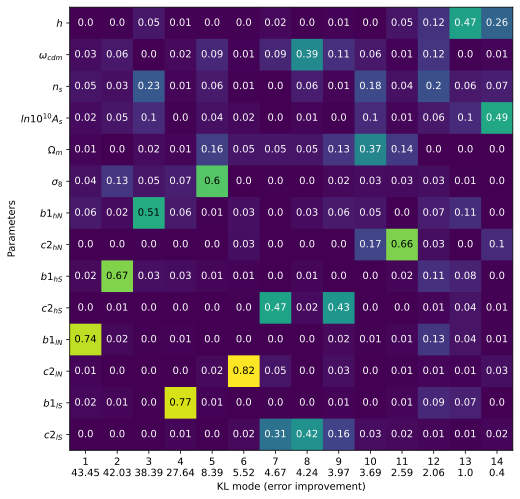

In [6]:
# Re-definition of params
params = ['h', 'omega_cdm', 'n_s', 'ln10^{10}A_s', 'Omega_m', 'sigma8', 
                'b1_hN', 'c2_hN', 'b1_hS', 'c2_hS', 'b1_lN', 'c2_lN', 'b1_lS', 'c2_lS']
labels = ['h', '\omega_{cdm}', 'n_s', '\ln{10^{10}A_s}', '\Omega_m', '\sigma_8',
                'b1_{hN}', 'c2_{hN}', 'b1_{hS}', 'c2_{hS}', 'b1_{lN}', 'c2_{lN}', 'b1_{lS}', 'c2_{lS}']

KL_eig, KL_eigv, KL_param_names = plot_frac_fisher(prior_chain=prior_chain, posterior_chain=posterior_chain, 
                                                   params=params, labels=labels, norm=True)

As you can see, the first 4 modes mainly inform the 4 sky-cuts of the EFT parameter $b1$: if we inspect this parameter's prior distribution we realize that it is flat whithin a quite large range if compared with the posterior's expected variance. This is equivalent to setting an uninformative prior: this parameter's values are therefore strongly data-constrained, and the most variance preserved by the KL modes is projected onto these directions.

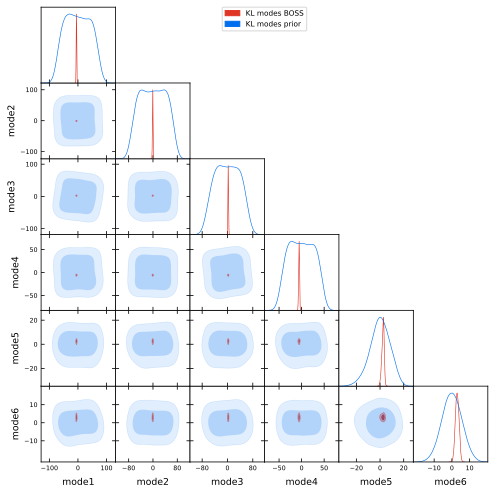

In [7]:
# List of indexes associated to each parameter
idx = [posterior_chain.index[name] for name in KL_param_names]
prior_mean = prior_chain.getMeans(pars=[prior_chain.index[name] for name in KL_param_names])
temp_names = ['mode'+str(i+1) for i in range(len(KL_param_names))]
# Projection on the KL modes
KL_filtered_samples = np.dot(posterior_chain.samples[:,idx]-prior_mean, KL_eigv)
# Building the chains using the same loglikes and weights of the original distributions
KL_chain = MCSamples(samples=KL_filtered_samples, 
                    loglikes=posterior_chain.loglikes, 
                    weights=posterior_chain.weights, 
                    names=temp_names, 
                    label='KL modes BOSS')
# Repeat for the prior
idx = [prior_chain.index[name] for name in KL_param_names]
KL_filtered_prior_samples = np.dot(prior_chain.samples[:,idx]-prior_mean, KL_eigv)
KL_prior_chain = MCSamples(samples=KL_filtered_prior_samples, 
                        loglikes=prior_chain.loglikes, 
                        weights=prior_chain.weights, 
                        names=temp_names, 
                        label='KL modes prior')
g = plots.get_subplot_plotter(width_inch=7)
g.settings.alpha_filled_add = 0.3
g.triangle_plot([KL_chain, KL_prior_chain], params=temp_names[:6], filled=True)

From the previous plot we notice that these first 6 modes are showing very constrained directions, that is, the 4 $b1$ sky-cuts, $\sigma_8$ and $c2_{lN}$, dominated by the data in spite of the uninformative flat prior.

In [8]:
dict = gaussian_tension.linear_CPCA_chains(prior_chain, posterior_chain, param_names=params)
print(gaussian_tension.print_CPCA_results(dict))

CPCA for 14 parameters:

   1 : h
   2 : \omega{}_{cdm }
   3 : n_{s }
   4 : ln10^{10}A_{s }
   5 : \Omega{}_{m }
   6 : \sigma_8
   7 : b1_{hN }
   8 : c2_{hN }
   9 : b1_{hS }
  10 : c2_{hS }
  11 : b1_{lN }
  12 : c2_{lN }
  13 : b1_{lS }
  14 : c2_{lS }

Neff = 12.04
Neff mode = [ 1.00 1.00 1.00 1.00 0.99 0.97 0.96 0.95 0.94 0.93 0.87 0.81 0.50 0.14]

<KL> divergence = 30.80
<KL> mode = [ 4.72 4.67 4.54 4.07 2.38 1.81 1.60 1.48 1.40 1.31 0.94 0.75 0.50 0.63]

CPC amplitudes - 1 (variance improvement per mode):
   1 : 1887.5799 (  4344.6 %)
   2 : 1766.6494 (  4203.2 %)
   3 : 1473.9454 (  3839.2 %)
   4 : 764.1467 (  2764.3 %)
   5 :  70.3123 (   838.5 %)
   6 :  30.4330 (   551.7 %)
   7 :  21.8355 (   467.3 %)
   8 :  17.9833 (   424.1 %)
   9 :  15.7702 (   397.1 %)
  10 :  13.6112 (   368.9 %)
  11 :   6.7094 (   259.0 %)
  12 :   4.2287 (   205.6 %)
  13 :   0.9975 (    99.9 %)
  14 :   0.1568 (    39.6 %)

CPC modes:
   1 :  -0.001  -0.001   0.005  -0.031  -0.001  -0.015   0

If we plot these new parameter definitions , we end up with very peaked distributions around the central value of $0$. As you can see from the previous list of KL principal components, the first best-constrained combinations depend on $b1$, once again showing this parameter's strong posterior improvement over the prior.

Finally, repeat the *prior removal* by sending it to zero or to infinity.

In [9]:
idx = [posterior_chain.index[name] for name in KL_param_names]
prior_mean = prior_chain.getMeans(pars=[prior_chain.index[name] for name in KL_param_names])
posterior_mean = posterior_chain.getMeans(pars=[posterior_chain.index[name] for name in KL_param_names])
inv_KL_eigv = np.linalg.inv(KL_eigv)
# Only keeping the first 11 modes
inv_KL_eigv[11:,:] = 0.
# Project the shifted posterior samples on the KL modes
KL_filtered_samples = np.dot(np.dot(posterior_chain.samples[:,idx]-prior_mean, KL_eigv), inv_KL_eigv)+prior_mean

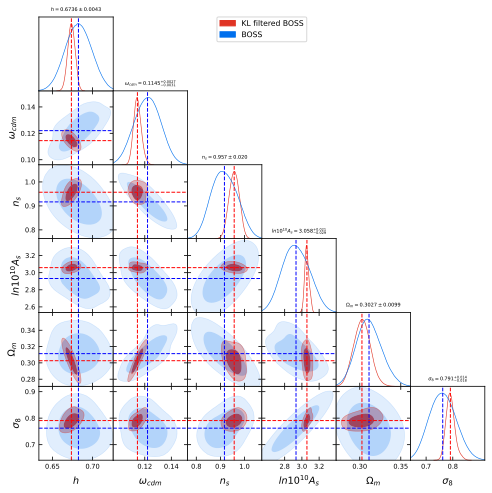

In [10]:
# Prior Shrinking
KL_chain = MCSamples(samples=KL_filtered_samples, 
                     loglikes=posterior_chain.loglikes, 
                     weights=posterior_chain.weights, 
                     names=params, 
                     labels=[name.label for name in posterior_chain.getParamNames().parsWithNames(params)], 
                     label='KL filtered BOSS',
                     settings={'ignore_rows':0.})
g = plots.get_subplot_plotter(width_inch=8)
g.settings.alpha_filled_add = 0.3
g.settings.title_limit_fontsize = 0.8
# The titles refer to the mean values of the KL posterior distributions
# Cosmological Parameters
temp_params = params[:6]
g.triangle_plot([KL_chain, posterior_chain], params=temp_params, filled=True, title_limit=1)
KL_means = KL_chain.getMeans(pars=[KL_chain.index[name] for name in temp_params])
means = posterior_chain.getMeans(pars=[posterior_chain.index[name] for name in temp_params])
# Display mean indicators
for i in range(len(temp_params)):
    # Fix the column, change the row -> decreasing from len(cosmo_params)
    for ax in g.subplots[i:,i]:
        ax.axvline(KL_means[i], color='red', lw=1., ls='--')
        ax.axvline(means[i], color='blue', lw=1., ls='--')
    # Fix the row, change the column -> increasing from 0
    for ax in g.subplots[i,:i]:
        ax.axhline(KL_means[i], color='red', lw=1., ls='--')
        ax.axhline(means[i], color='blue', lw=1., ls='--')

In [11]:
# EFT Parameters
g = plots.get_subplot_plotter(width_inch=10)
g.settings.alpha_filled_add = 0.3
g.settings.title_limit_fontsize = 0.8
# The titles refer to the mean values of the KL posterior distributions
temp_params = params[6:]
g.triangle_plot([KL_chain, posterior_chain], params=temp_params, filled=True, title_limit=1)
KL_means = KL_chain.getMeans(pars=[KL_chain.index[name] for name in temp_params])
means = posterior_chain.getMeans(pars=[posterior_chain.index[name] for name in temp_params])
# Display mean indicators
for i in range(len(temp_params)):
    # Fix the column, change the row -> decreasing from len(cosmo_params)
    for ax in g.subplots[i:,i]:
        ax.axvline(KL_means[i], color='red', lw=1., ls='--')
        ax.axvline(means[i], color='blue', lw=1., ls='--')
    # Fix the row, change the column -> increasing from 0
    for ax in g.subplots[i,:i]:
        ax.axhline(KL_means[i], color='red', lw=1., ls='--')
        ax.axhline(means[i], color='blue', lw=1., ls='--')

We can notice a weird behavior on this plot, in contrast with what we described earlier: the previous analysis suggested that the best-constrained EFT parameters were the $b1$'s sky-cuts. In fact the KL principal components were strongly $b1$-dependent and the first KL modes mostly informed them.\
However, here we observe that the KL-filtered $b1$ posterior distributions are quite different from the original ones: this means that the prior shrinking has some kind of impact on the parameter's constraint and the posterior-over-prior improvement is not as strong as we expected. In addition, look at the $b1_{hS} - b1_{hN}$ plane: the posterior's variance is well-preseved along one direction that is a combination of both parameters.\
On the other hand, notice how the $c2$ KL-filtered posteriors align with the original distributions.

These evidences suggest that the **best-constrained EFT parameters** are actually the $c2$ sky-cuts and various combinations of the $b1$ sky-cuts.\
Now we try out with the prior explosion looking for a validation of these results.

In [12]:
# Prior Explosion
idx = [posterior_chain.index[name] for name in KL_param_names]
prior_mean = prior_chain.getMeans(pars=[prior_chain.index[name] for name in KL_param_names])
inv_KL_eigv = np.linalg.inv(KL_eigv)
# Invert the values then send them to 0: this is equivalent to set them to infinity
KL_eig_inv = 1./KL_eig
KL_eig_inv[:12] = 0.
KL_filtered_samples = np.dot(np.dot(np.diag(1./(1.-KL_eig_inv)), 
                                    np.dot(KL_eigv.T, (posterior_chain.samples[:,idx]).T)).T-np.dot(np.diag(1./(1.-KL_eig_inv)*KL_eig_inv), 
                                                                                          np.dot(KL_eigv.T, prior_mean)), 
                                    inv_KL_eigv)

KL_chain = MCSamples(samples=KL_filtered_samples, 
                     loglikes=posterior_chain.loglikes, 
                     weights=posterior_chain.weights, 
                     names=params, 
                     labels=[name.label for name in posterior_chain.getParamNames().parsWithNames(params)], 
                     label='KL filtered BOSS',
                     settings={'ignore_rows':0.})

In [13]:
# Cosmological Parameters
g = plots.get_subplot_plotter(width_inch=8)
g.settings.alpha_filled_add = 0.3
g.settings.title_limit_fontsize = 0.8
# The titles refer to the mean values of the KL posterior distributions
temp_params = params[:6]
g.triangle_plot([posterior_chain, KL_chain], params=temp_params, filled=True, title_limit=1);
KL_means = KL_chain.getMeans(pars=[KL_chain.index[name] for name in temp_params])
means = posterior_chain.getMeans(pars=[posterior_chain.index[name] for name in temp_params])
# Display mean indicators
for i in range(len(temp_params)):
    # Fix the column, change the row -> decreasing from len(cosmo_params)
    for ax in g.subplots[i:,i]:
        ax.axvline(KL_means[i], color='blue', lw=1., ls='--')
        ax.axvline(means[i], color='red', lw=1., ls='--')
    # Fix the row, change the column -> increasing from 0
    for ax in g.subplots[i,:i]:
        ax.axhline(KL_means[i], color='blue', lw=1., ls='--')
        ax.axhline(means[i], color='red', lw=1., ls='--')

In [14]:
# EFT Parameters
g = plots.get_subplot_plotter(width_inch=10)
g.settings.alpha_filled_add = 0.3
g.settings.title_limit_fontsize = 0.8

temp_params = params[6:]
g.triangle_plot([posterior_chain, KL_chain], params=temp_params, filled=True, title_limit=1);
KL_means = KL_chain.getMeans(pars=[KL_chain.index[name] for name in temp_params])
means = posterior_chain.getMeans(pars=[posterior_chain.index[name] for name in temp_params])
# Display mean indicators
for i in range(len(temp_params)):
    # Fix the column, change the row -> decreasing from len(cosmo_params)
    for ax in g.subplots[i:,i]:
        ax.axvline(KL_means[i], color='blue', lw=1., ls='--')
        ax.axvline(means[i], color='red', lw=1., ls='--')
    # Fix the row, change the column -> increasing from 0
    for ax in g.subplots[i,:i]:
        ax.axhline(KL_means[i], color='blue', lw=1., ls='--')
        ax.axhline(means[i], color='red', lw=1., ls='--')

: 

As you can see from the plot above, for the EFT parameter $c2_{hS}$ we find that both prior shrinking and explosion preserve the posterior distribution's shape, suggesting that this parameter is slighlty informed by the prior distribution. This effect is visible also on the $b1_{hN} - b1_{hS}$ plane (as well as on other $b1$ planes), where we notice that the joint posterior's width is well-preserved on a direction that is a combination of the 2 parameters.\
These results are in partial agreement with the ones discussed before applying the prior explosion.

These conclusions still appear to be in contrast with our previous analysis, where we discovered that the best-constrained modes were mostly $b1$-dependent. We now try to solve this issue deepening into the linear CPCA computation.

#### Fisher Matrix Normalization
First of all we need to solve the following issue: the Fisher matrix computed by the function `Q_UDL_fisher_components()` has rows adding up to $1$, as expected, but the columns do not meet this requirement. This could imply a wrong normalization technique, therefore we are going to use `tensiometer_dev`'s function called `linear_CPCA_chains` to evaluate the matrix using specifically the prior and posterior distributions.\
Remember that each cell represents the fraction of each mode's contribute to the parameter's variance and vice-versa, therefore we are expecting both rows and columns to sum up to $1$.

In [ ]:
# Current Matrix
dict = gaussian_tension.linear_CPCA_chains(prior_chain, posterior_chain, param_names=params)
var_matrix = dict['CPCA_var_contributions']
# Do rows and columns add up to 1?
print('Rows sum = ', var_matrix.sum(axis=1))
print('Cols sum = ', var_matrix.sum(axis=0))

Rows sum =  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
Cols sum =  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [ ]:
# Q_UDM_fisher_components matrix
_, _, var_matrix, _ = gaussian_tension.Q_UDM_fisher_components(prior_chain, posterior_chain, param_names=params, which='1')
# Do rows and columns add up to 1?
print('Rows sum = ', var_matrix.sum(axis=1))
print('Cols sum = ', ['{0:0.1f}'.format(i) for i in var_matrix.sum(axis=0)])

Rows sum =  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
Cols sum =  ['1.0', '1.0', '0.9', '1.0', '0.3', '0.9', '1.2', '2.4', '1.0', '0.8', '1.0', '1.4', '1.0', '0.2']


The Fisher matrix is now correctly normalized: that's why, in `utils.plot_frac_fisher()`, you can see that we changed the default Fisher matrix output of the built-in Tensiometer function. We also have changed the resulting best-constrained modes, using the `print_CPCA_results()` function, since we now must compute them based on the CPCA analysis.
#### Best-constrained modes on parameter space
We can visualize the KL modes with $\left(\Lambda^{T}\right)^{-1}$, where $\Lambda$ is the eigenvector matrix.

In [ ]:
import seaborn as sns
param_directions = np.linalg.inv(KL_eigv.T)
g = plots.get_subplot_plotter()
g.triangle_plot([posterior_chain], params=KL_param_names, filled=True)
# Add the modes' directions
for i in range(len(KL_param_names)-1):
    for j in range(i+1,len(KL_param_names)):
        ax = g.subplots[j,i]
        # get mean:
        m1, m2 = posterior_chain.getMeans(pars=[posterior_chain.index[name]
                       for name in [KL_param_names[i], KL_param_names[j]]])
        ax.scatter(np.exp(m1), np.exp(m2), color='k')
        alpha = 3.*np.linspace(-1.,1.,100)
        for k in range(3):
            ax.plot(m1+alpha*param_directions[:,k][i], m2+alpha*param_directions[:,k][j], color=sns.hls_palette(6)[k], label='Mode '+str(k+1))
g.fig.legend(*ax.get_legend_handles_labels());